In [1]:
import os
import numpy as np
import pickle
from statsmodels.stats.multitest import fdrcorrection
import scipy.stats as stats
import csv
import scipy.io as sio
import matplotlib.pyplot as plt
from scipy import stats
from nilearn.image import new_img_like
import pandas as pd
import nibabel as nib
import seaborn as sns
from nilearn import plotting
from rsatoolbox.inference import eval_fixed
from rsatoolbox.model import ModelFixed
from rsatoolbox.rdm import RDMs
from glob import glob
from rsatoolbox.util.searchlight import get_volume_searchlight, get_searchlight_RDMs, evaluate_models_searchlight

import torch
from torch import optim, nn
from torchvision import models, transforms
from tqdm import tqdm
import cv2
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
from torchvision.models.feature_extraction import get_graph_node_names
from torchvision.models.feature_extraction import create_feature_extractor
from tqdm import tqdm

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def upper_tri(RDM):
    """upper_tri returns the upper triangular index of an RDM

    Args:
        RDM 2Darray: squareform RDM

    Returns:
        1D array: upper triangular vector of the RDM
    """
    # returns the upper triangle
    m = RDM.shape[0]
    r, c = np.triu_indices(m, 1)
    return RDM[r, c]

In [3]:
import matplotlib.colors
def RDMcolormapObject(direction=1):
    """
    Returns a matplotlib color map object for RSA and brain plotting
    """
    if direction == 0:
        cs = ['yellow', 'red', 'gray', 'turquoise', 'blue']
    elif direction == 1:
        cs = ['blue', 'turquoise', 'gray', 'red', 'yellow']
    else:
        raise ValueError('Direction needs to be 0 or 1')
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", cs)
    return cmap

In [3]:
tmp_image_path = '../IAPS_fMRI_RSA/fMRI/nifti/Nt1.img'
# load one image to get the dimensions and make the mask

tmp_img = nib.load(tmp_image_path)

## Import fMRI data

In [3]:
# type(allsub_avg)
np.save('my_list.npy', allsub_avg)

In [2]:
dbfile = open('./outputs/20sub_fmri_rdm', 'rb')     
allsub_avg = pickle.load(dbfile)

In [7]:
len(allsub_avg)

20

### Plot one stimulus image out of the 60 images 

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_stat_map.py:219: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  bg_img = load_mni152_template()
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



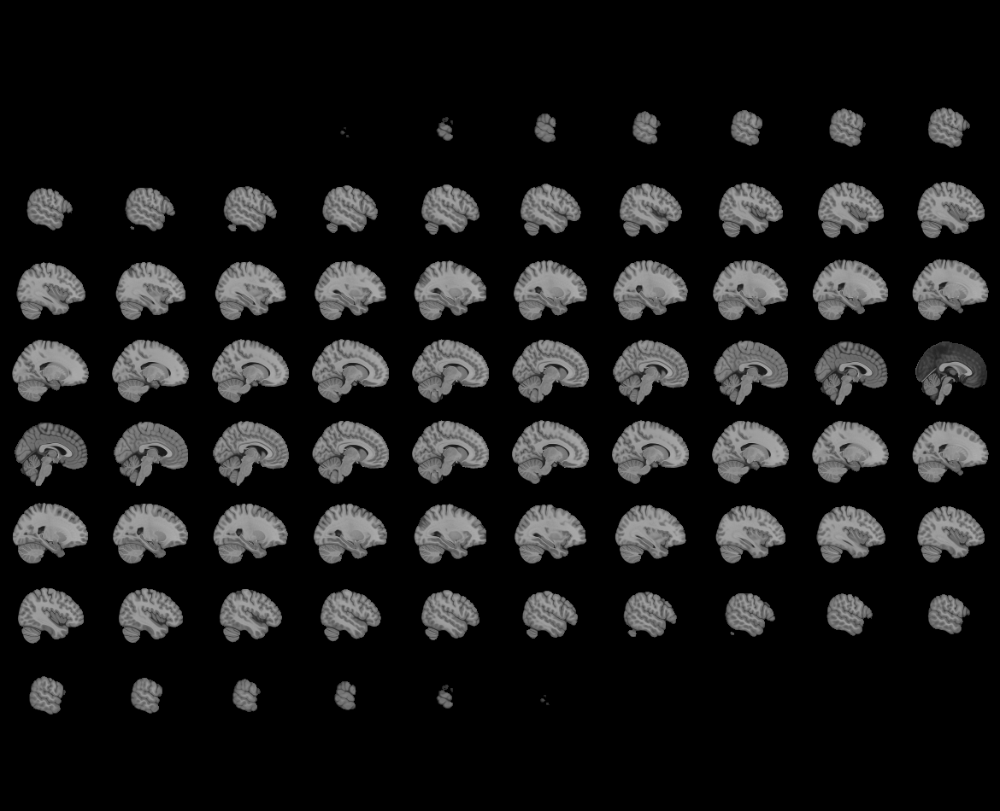
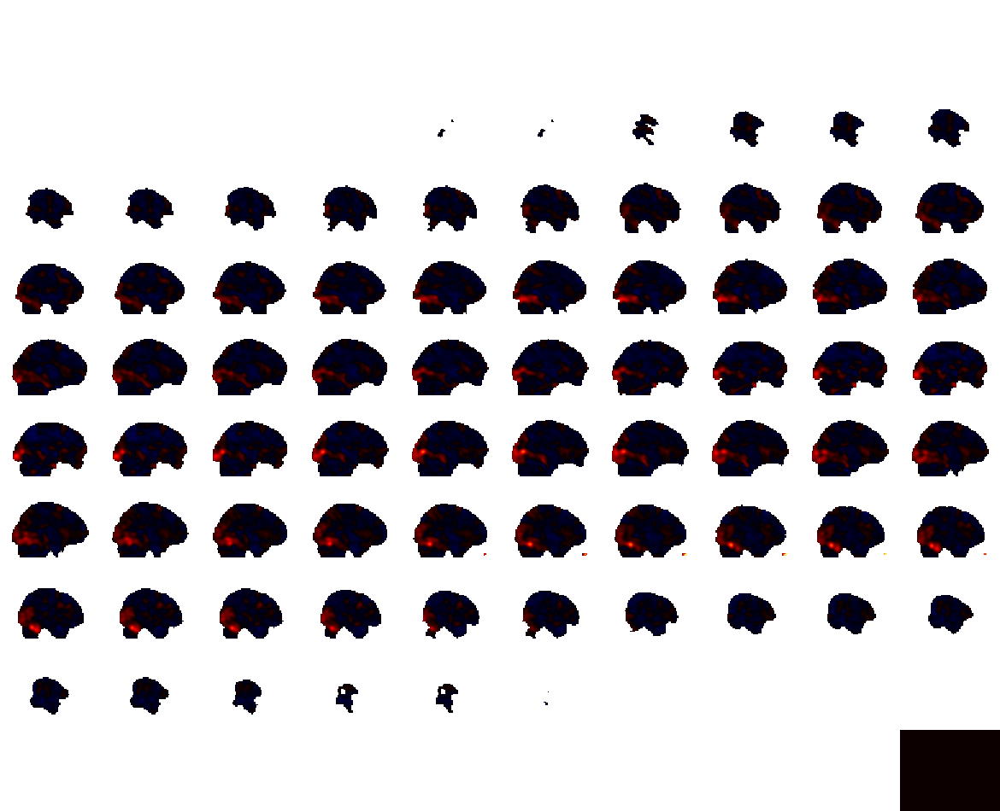

In [8]:
plot_slice = np.array(allsub_avg[10])[1,:]
plot_slice_3d = plot_slice.reshape(53, 63, 46)
plot_neural_rdm_cont1 = new_img_like(tmp_img, plot_slice_3d)
view = plotting.view_img(plot_neural_rdm_cont1)
view

## Load CNN RDMs

In [14]:
layer_rdms_relu = np.load('../IAPS_NN_correlation/VGG19/outputs/rdms_relu.npy')


In [16]:
layer_rdms_relu.shape

(19, 60, 60)

### Compute NN layer RDM models

In [20]:
nn_rdm_models = []
for i, rdm in enumerate(layer_rdms_relu):
    nn_rdm_model = ModelFixed('Layer {} RDM'.format(i), upper_tri(rdm))
    nn_rdm_models.append(nn_rdm_model)

In [22]:
np.array(nn_rdm_models).shape

(19,)

## Searchlight analysis

### Load mask

In [17]:
# Import mask
mask = np.load("./mask.npy")

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:274: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



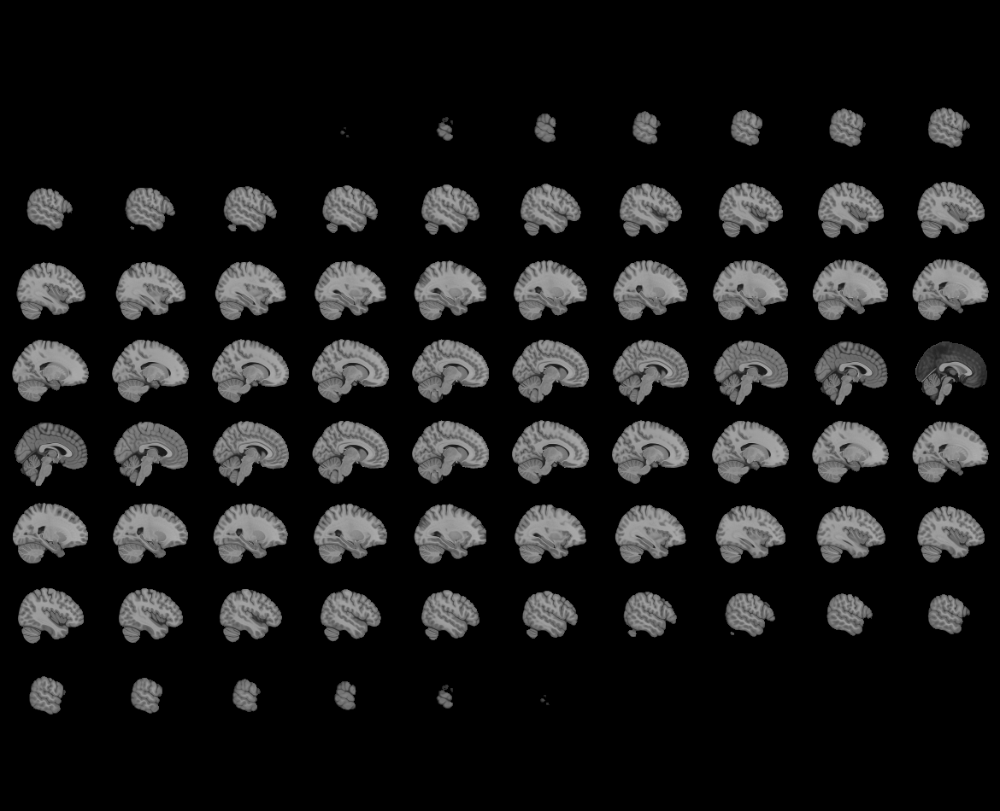
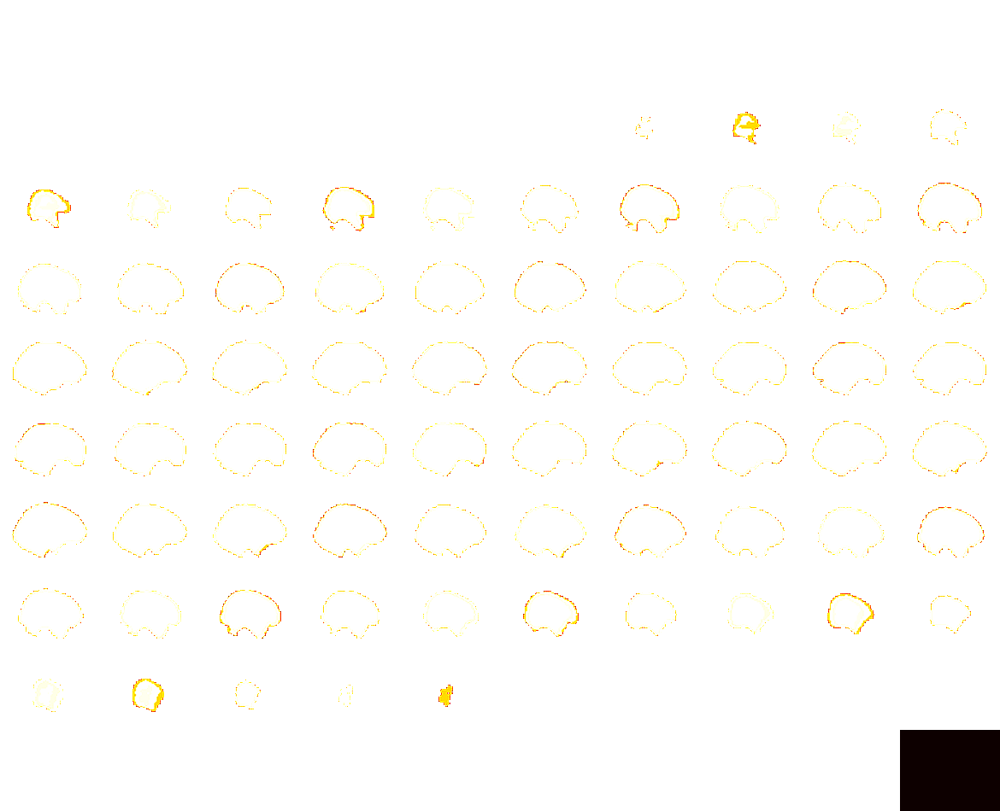

In [18]:
mask_3d = new_img_like(tmp_img, mask)
view = plotting.view_img(mask_3d)
view

### Create searchlight centers and neighbours

In [19]:
centers, neighbors = get_volume_searchlight(mask, radius=5, threshold=0.5)

Finding searchlights...: 100%|██████████| 59159/59159 [00:21<00:00, 2724.14it/s]


Found 56949 searchlights


In [28]:
SL_eval_score_list = []
SL_RDM_brain_list = []
features_namelist = ['features.1', 
'features.3', 
'features.6', 
'features.8', 
'features.11', 
'features.13', 
'features.15', 
'features.17', 
'features.20', 
'features.22', 
'features.24', 
'features.26', 
'features.29', 
'features.31', 
'features.33', 
'features.35', 
'classifier.0', 
'classifier.3', 
'classifier.6'] 

for n, nn_rdm_model in enumerate(nn_rdm_models): # layer
    eval_score_list = []
    RDM_brain_list = []
    
    for i in tqdm(range(20)): #subject
        subj_data = allsub_avg[i]
        subj_data_2d = np.nan_to_num(subj_data)

        image_value = np.arange(60)
        SL_RDM = get_searchlight_RDMs(subj_data_2d, centers, neighbors, image_value, method='correlation')

        eval_results = evaluate_models_searchlight(SL_RDM, nn_rdm_model, eval_fixed, method='spearman', n_jobs=3)

        # get the evaulation score for each voxel
        # We only have one model, but evaluations returns a list. By using float we just grab the value within that list
        eval_score = [np.float(e.evaluations) for e in eval_results]

        # Create an 3D array, with the size of mask, and
        x, y, z = mask.shape
        RDM_brain = np.zeros([x*y*z])
        RDM_brain[list(SL_RDM.rdm_descriptors['voxel_index'])] = eval_score
        RDM_brain = RDM_brain.reshape([x, y, z])

        eval_score_list.append(eval_score)
        RDM_brain_list.append(RDM_brain)

    SL_eval_score_list.append(eval_score_list)
    SL_RDM_brain_list.append(RDM_brain_list)

SL_feat_eval_score = dict(zip(features_namelist, SL_eval_score_list))
SL_feat_RDM_brain = dict(zip(features_namelist, SL_RDM_brain_list))

Evaluating models for each searchlight: 100%|██████████| 56949/56949 [01:35<00:00, 598.65it/s]
C:\Users\yujunchen\AppData\Local\Temp\ipykernel_18468\530164226.py:38: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eval_score = [np.float(e.evaluations) for e in eval_results]
  5%|▌         | 1/20 [06:09<1:56:57, 369.36s/it]


MemoryError: Unable to allocate 769. MiB for an array with shape (56949, 1770) and data type float64

### Export/Load searchlight results

In [64]:
# Export
# Save the evaluation scores and RDMs.

pd.DataFrame(SL_feat_eval_score).to_csv("./outputs/20sub_SL_eval_score_nn.csv")
dbfile= open('./outputs/20sub_SL_rdm_brain_nn', 'ab')
pickle.dump(SL_feat_RDM_brain, dbfile)                     
dbfile.close()

In [53]:
# Import
SL_feat_eval_score_df = pd.read_csv("./outputs/20sub_SL_eval_score_nn.csv")
SL_feat_eval_score = SL_feat_eval_score_df.values.tolist()
dbfile = open('./outputs/20sub_SL_rdm_brain_nn', 'rb')
SL_feat_RDM_brain = pickle.load(dbfile)

## Plot results

### Correlation distribution across subject

In [1]:
sns.displot(SL_feat_eval_score["features_pl_1"])
plt.title('Distributions of correlations', size=18)
plt.ylabel('Occurance', size=18)
plt.xlabel('Spearmann correlation', size=18)
sns.despine()
plt.show()

NameError: name 'sns' is not defined

### Brain plot - Max Pooling 1 

In [63]:
# lets plot the voxels above the 99th percentile
threshold = np.percentile(SL_feat_eval_score["features_pl_1"][19], 99)
plot_img = new_img_like(tmp_img, SL_feat_RDM_brain["features_pl_1"][19])
cmap = RDMcolormapObject()
coords = range(-100, 100, 5)

c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\img_plotting.py:300: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  anat_img = load_mni152_template()


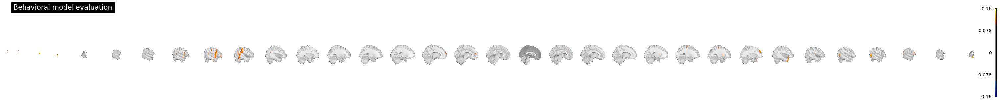

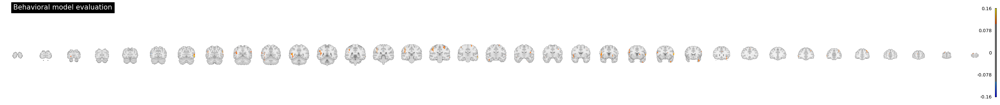

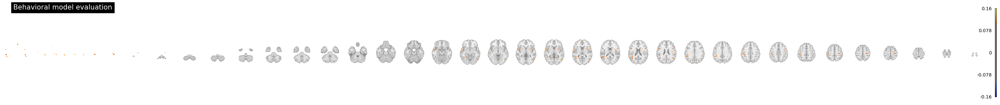

In [64]:
fig_x = plt.figure(figsize=(30, 3))
display_x = plotting.plot_stat_map(
        plot_img, colorbar=True, cut_coords=coords,threshold=threshold,
        display_mode='x', draw_cross=False, figure=fig_x,
        title=f'Behavioral model evaluation', cmap=cmap,
        black_bg=False, annotate=False)

fig_y = plt.figure(figsize=(30, 3))
display_y = plotting.plot_stat_map(
        plot_img, colorbar=True, cut_coords=coords,threshold=threshold,
        display_mode='y', draw_cross=False, figure=fig_y,
        title=f'Behavioral model evaluation', cmap=cmap,
        black_bg=False, annotate=False)

fig_z = plt.figure(figsize=(30, 3))        
display_z = plotting.plot_stat_map(
        plot_img, colorbar=True, cut_coords=coords,threshold=threshold,
        display_mode='z', draw_cross=False, figure=fig_z,
        title=f'Behavioral model evaluation', cmap=cmap,
        black_bg=False, annotate=False)

# # Create new figure and three subplots, sharing axes
# fig3, (ax1, ax2, ax3) = plt.subplots(3,1,sharey=True, sharex=True,figsize=(60,12))        
# fig3.show()
plt.show()

## Across subject plots

### Max Pooling 1

In [65]:

#features_namelist = ["features_pl_1", "features_pl_2", "features_pl_3", "features_pl_4", "features_pl_5", "features_fc_1", "features_fc_2"]

RDM_brain = SL_feat_RDM_brain["features_pl_1"]


for i in range(20):
    sl_max = np.max(RDM_brain[i])
    sl_min = np.min(RDM_brain[i])
    sl_mid = np.median(RDM_brain[i])
    print("Subject{} max:{}, mid:{}, min:{}".format(i+1,sl_max,sl_mid, sl_min ))

Subject1 max:0.3132889854261317, mid:0.0, min:-0.31078759289177565
Subject2 max:0.24893851468841277, mid:0.0, min:-0.377299347713585
Subject3 max:0.24939730890176065, mid:0.0, min:-0.26909857210769556
Subject4 max:0.2819592895497705, mid:0.0, min:-0.23364210224286722
Subject5 max:0.28106402084156196, mid:0.0, min:-0.2833100198781071
Subject6 max:0.26077674492214103, mid:0.0, min:-0.24625759925253835
Subject7 max:0.26439493488894605, mid:0.0, min:-0.23530609849789802
Subject8 max:0.19509891745307797, mid:0.0, min:-0.2966197912724372
Subject9 max:0.3071690934698859, mid:0.0, min:-0.3107064853632804
Subject10 max:0.27152490338982677, mid:0.0, min:-0.30423945405068353
Subject11 max:0.2615565219631067, mid:0.0, min:-0.3142449657595253
Subject12 max:0.3326260740979056, mid:0.0, min:-0.2944772800754785
Subject13 max:0.18119600505820568, mid:0.0, min:-0.37949979409605256
Subject14 max:0.33647621038879566, mid:0.0, min:-0.3312304836023944
Subject15 max:0.20216029079818917, mid:0.0, min:-0.28543

In [79]:
RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.1, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)
    sl_max = np.max(RDM_brain_bin_list[i])
    sl_min = np.min(RDM_brain_bin_list[i])
    print("Subject{} max:{}, min:{}".format(i+1,sl_max,sl_min ))    

Subject1 max:1, min:0
Subject2 max:1, min:0
Subject3 max:1, min:0
Subject4 max:1, min:0
Subject5 max:1, min:0
Subject6 max:1, min:0
Subject7 max:1, min:0
Subject8 max:1, min:0
Subject9 max:1, min:0
Subject10 max:1, min:0
Subject11 max:1, min:0
Subject12 max:1, min:0
Subject13 max:1, min:0
Subject14 max:1, min:0
Subject15 max:1, min:0
Subject16 max:1, min:0
Subject17 max:1, min:0
Subject18 max:1, min:0
Subject19 max:1, min:0
Subject20 max:1, min:0


In [80]:
RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
RDM_brain_bin_array.shape

(20, 53, 63, 46)

In [81]:
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
sl_bin_max = np.max(SL_threshcount)
sl_bin_min = np.min(SL_threshcount)
print("max:{}, min:{}".format(sl_bin_max,sl_bin_min ))

max:11, min:0


c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



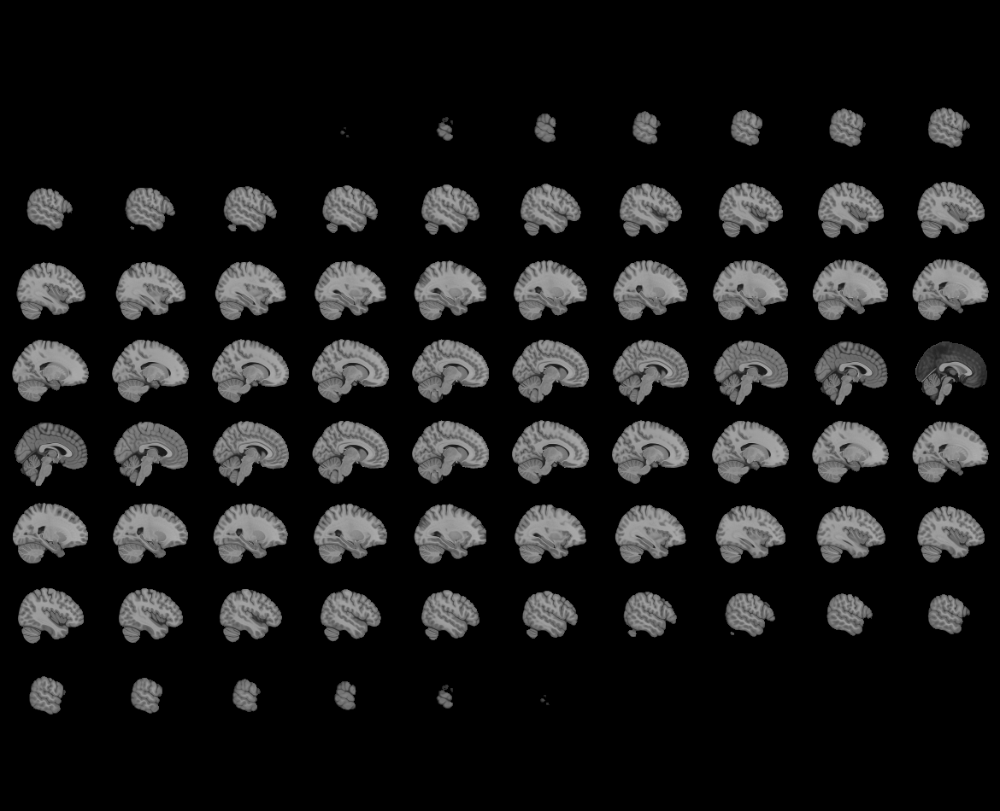
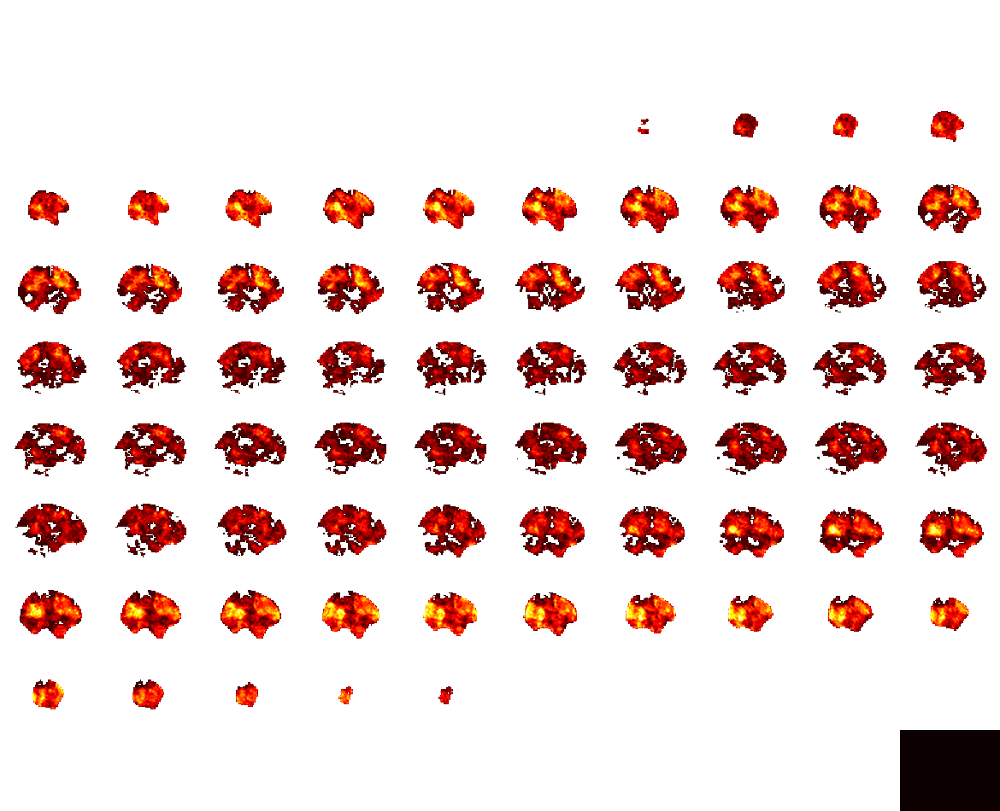

In [82]:
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Max Pooling 2

c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



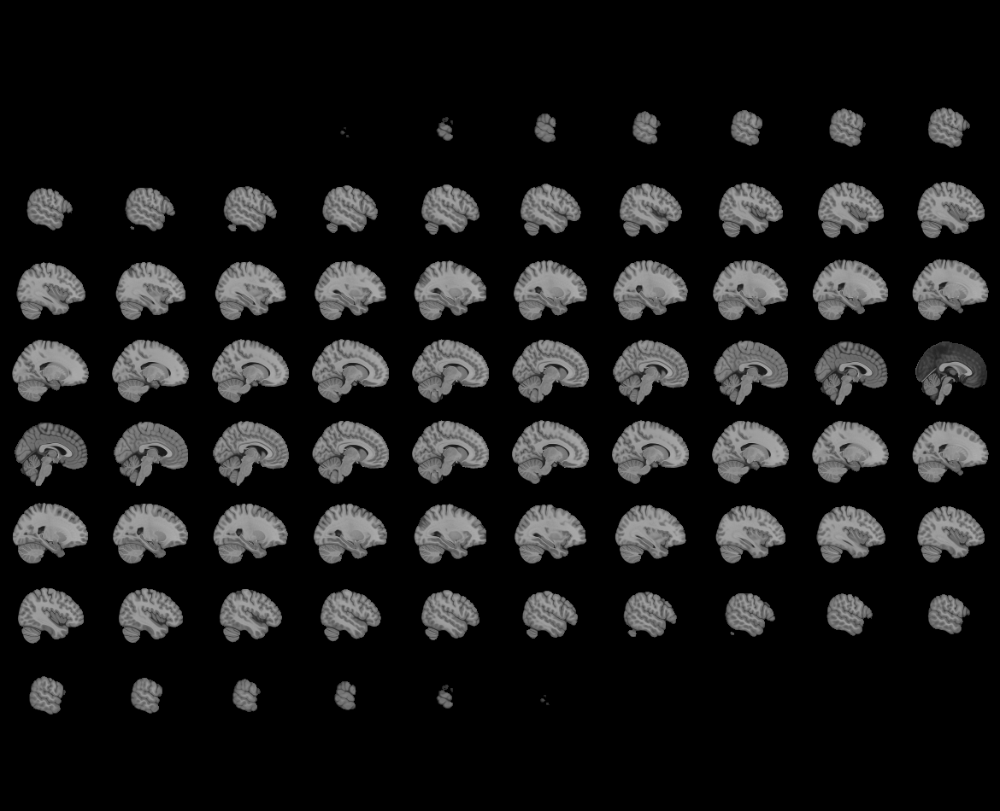
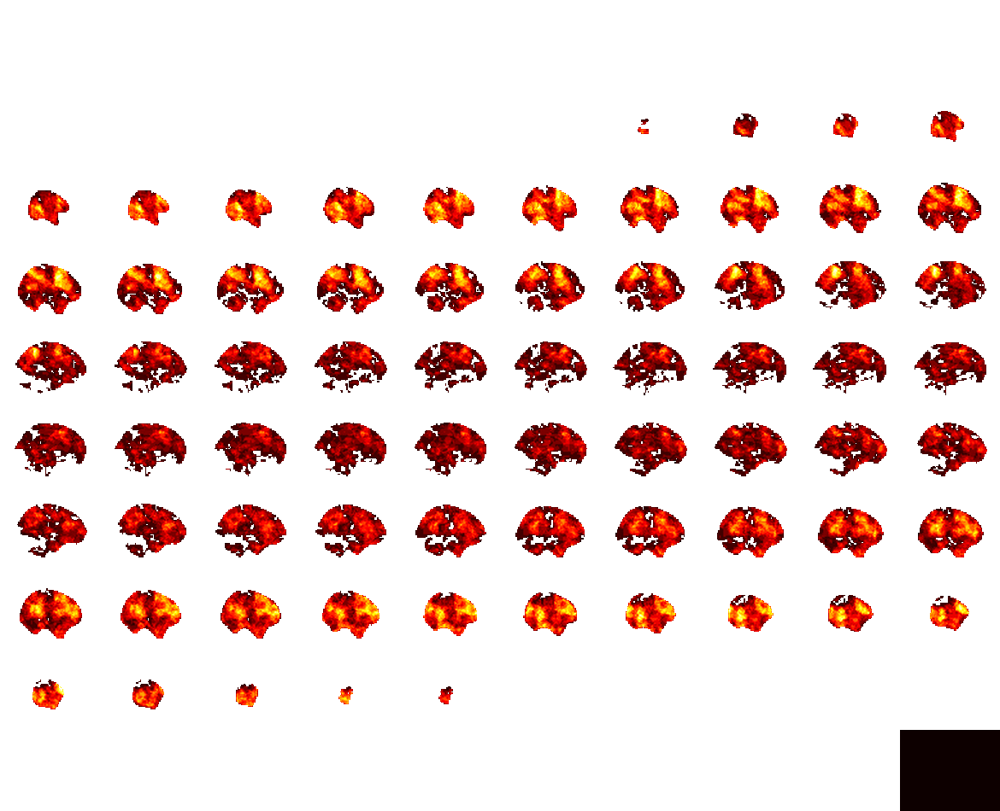

In [83]:
RDM_brain = SL_feat_RDM_brain["features_pl_2"]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.1, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Max Pooling 3

c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



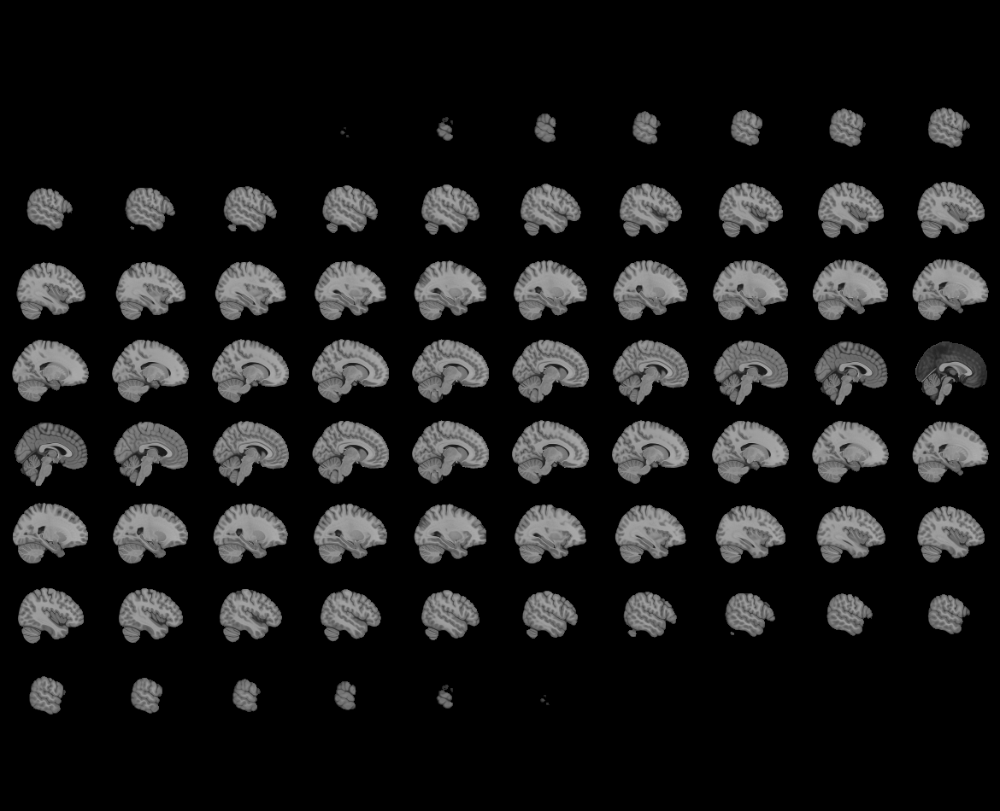
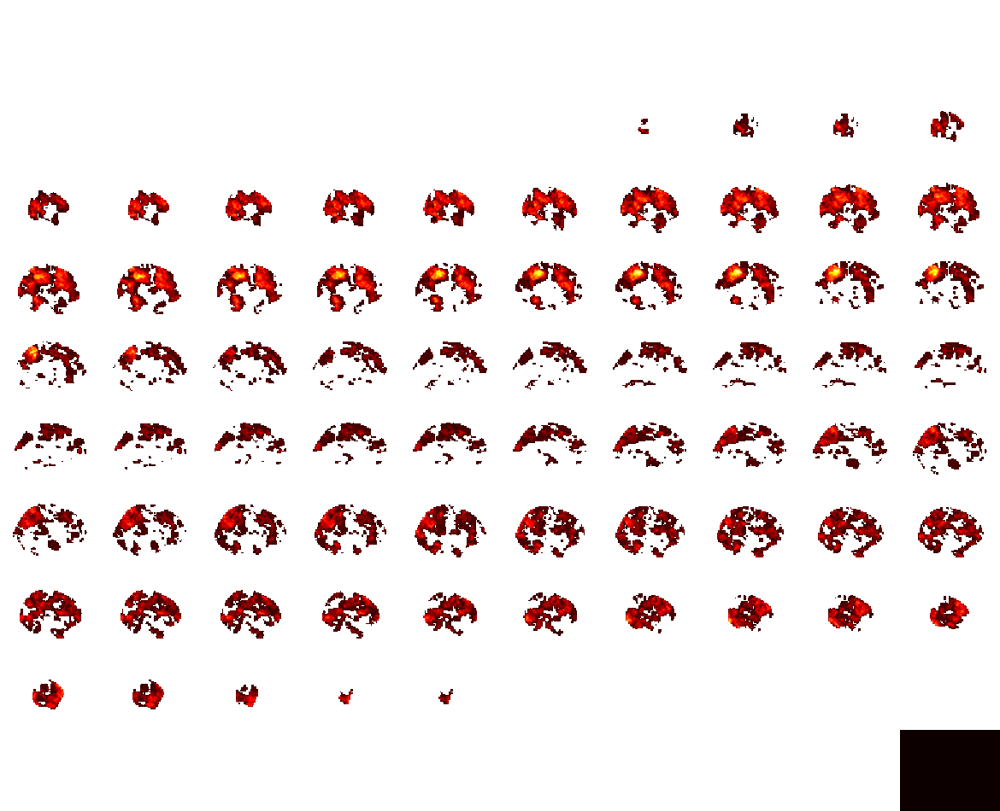

In [84]:
RDM_brain = SL_feat_RDM_brain["features_pl_3"]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.1, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Max Pooling 4

c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



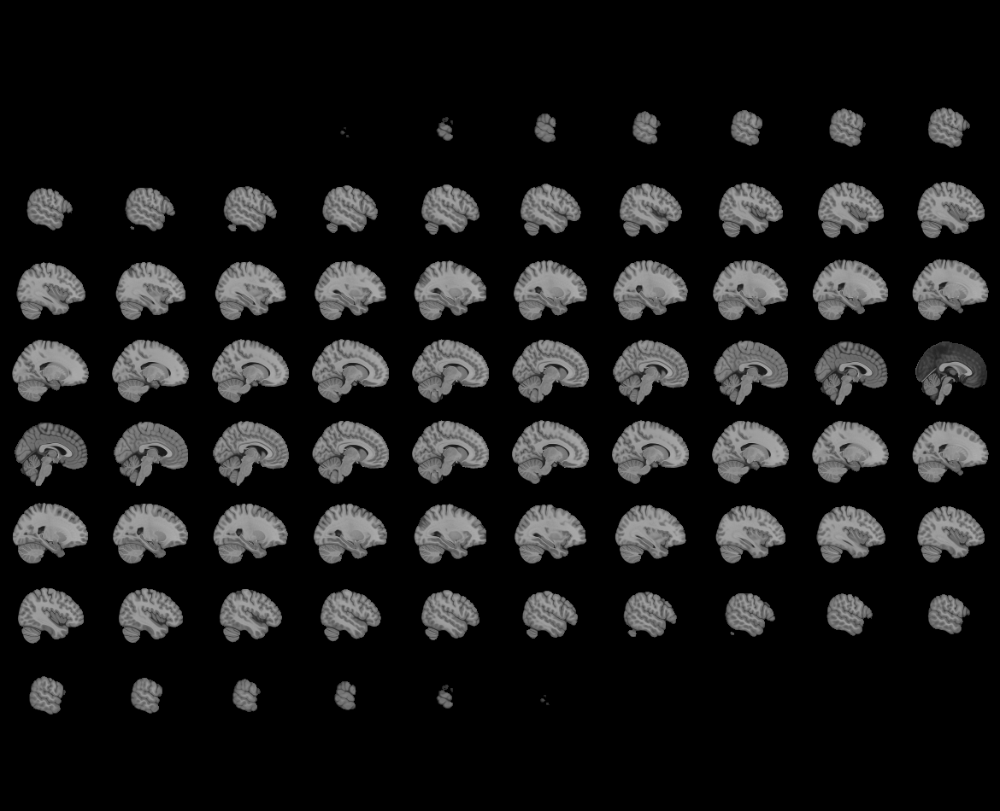
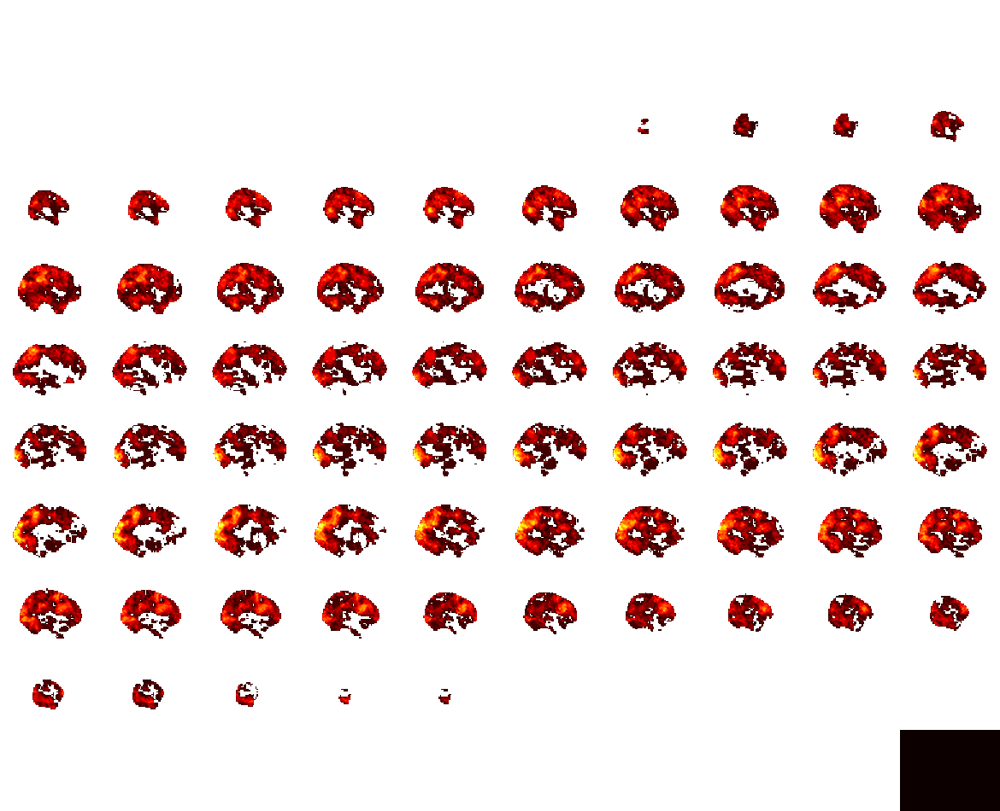

In [85]:
RDM_brain = SL_feat_RDM_brain["features_pl_4"]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > 0.1, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img)
view

### Max Pooling 5

c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



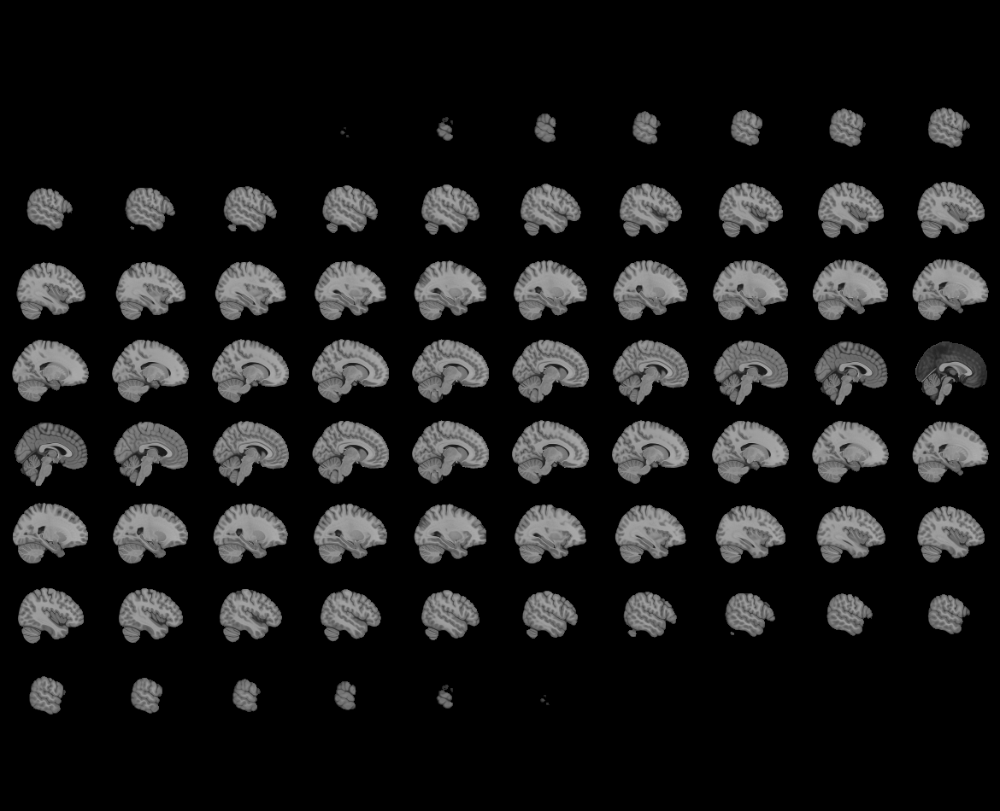
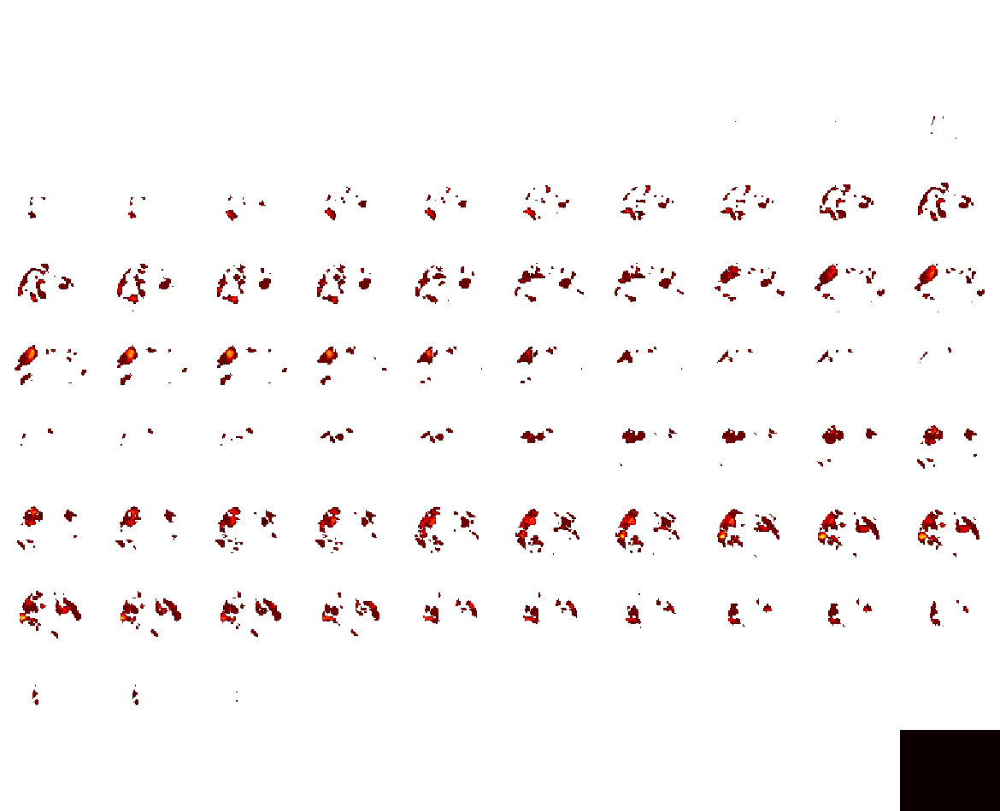

In [91]:
threshold_value = 0.2

RDM_brain = SL_feat_RDM_brain["features_pl_5"]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > threshold_value, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img, title = "threshold_value = {}".format(threshold_value))
view

### Fully Connetected 1

c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



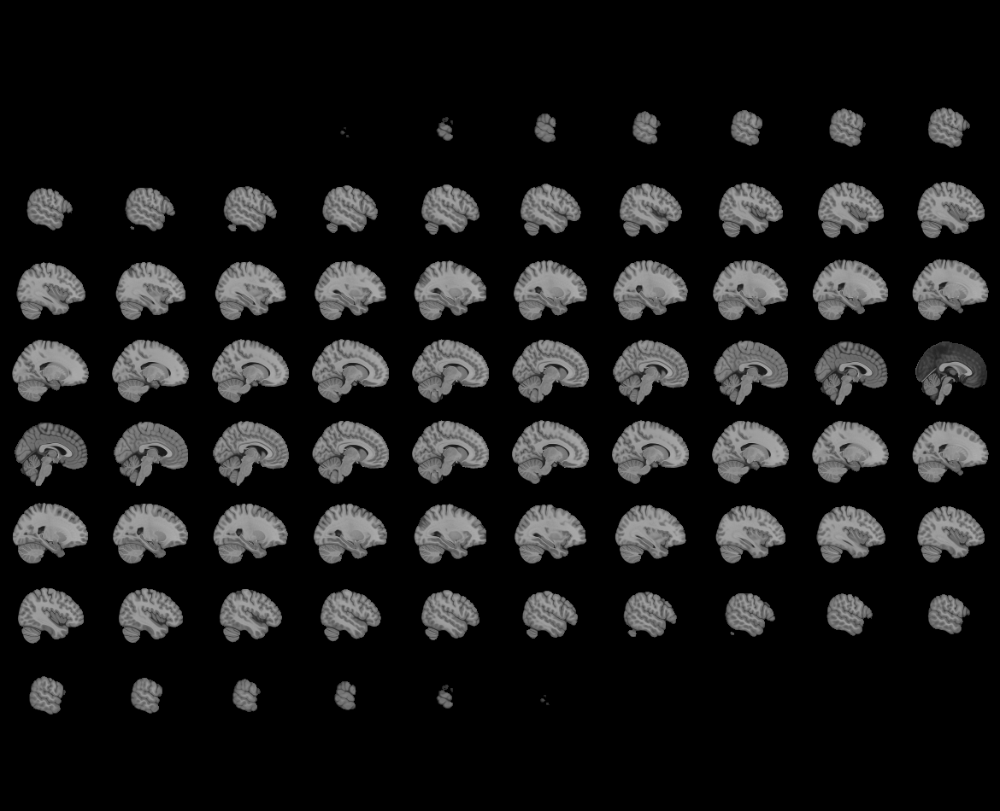
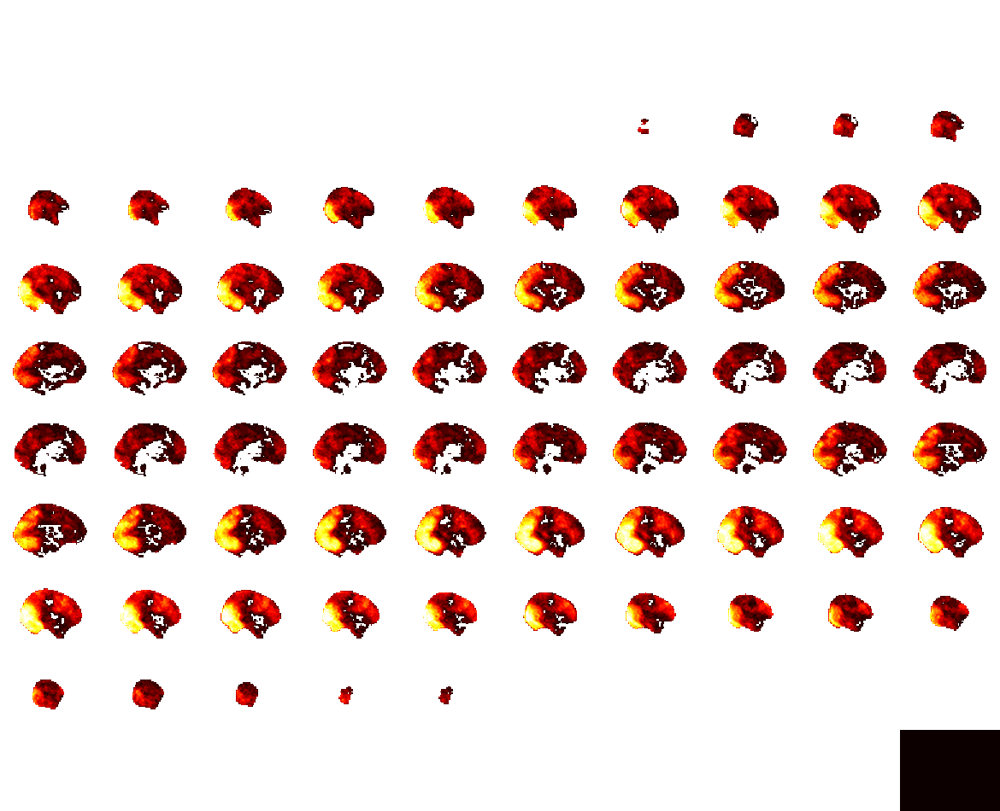

In [97]:
threshold_value = 0.1

RDM_brain = SL_feat_RDM_brain["features_fc_1"]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > threshold_value, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img, title = "threshold_value = {}".format(threshold_value))
view

### Fully Connetected 2

c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



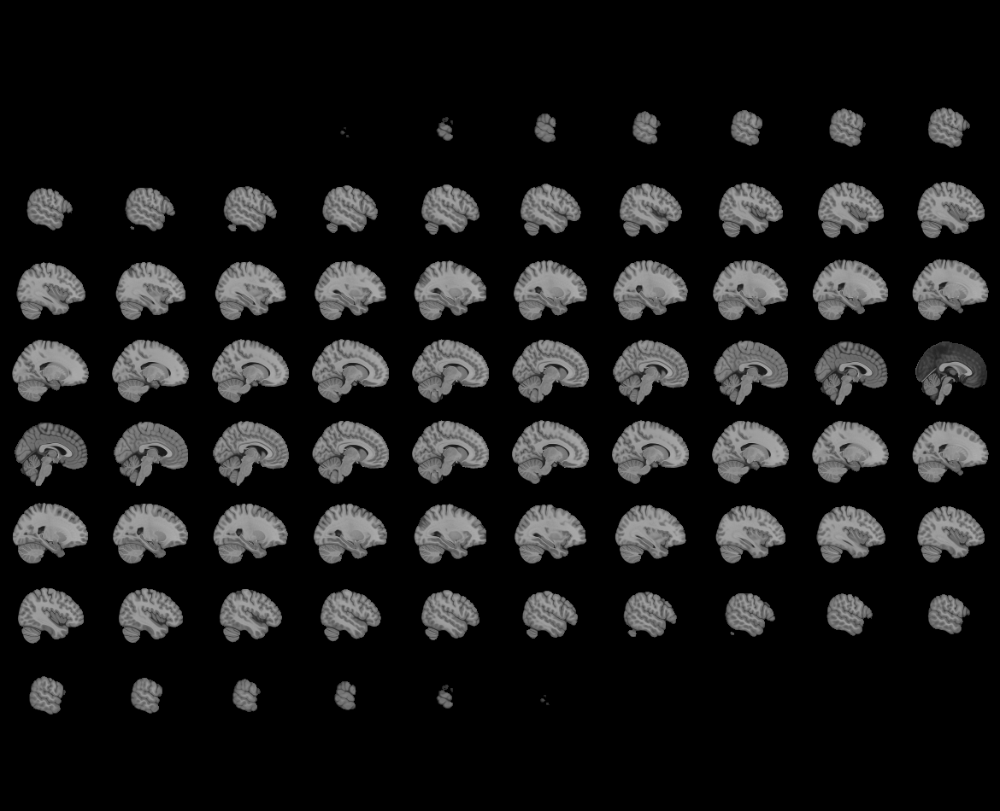
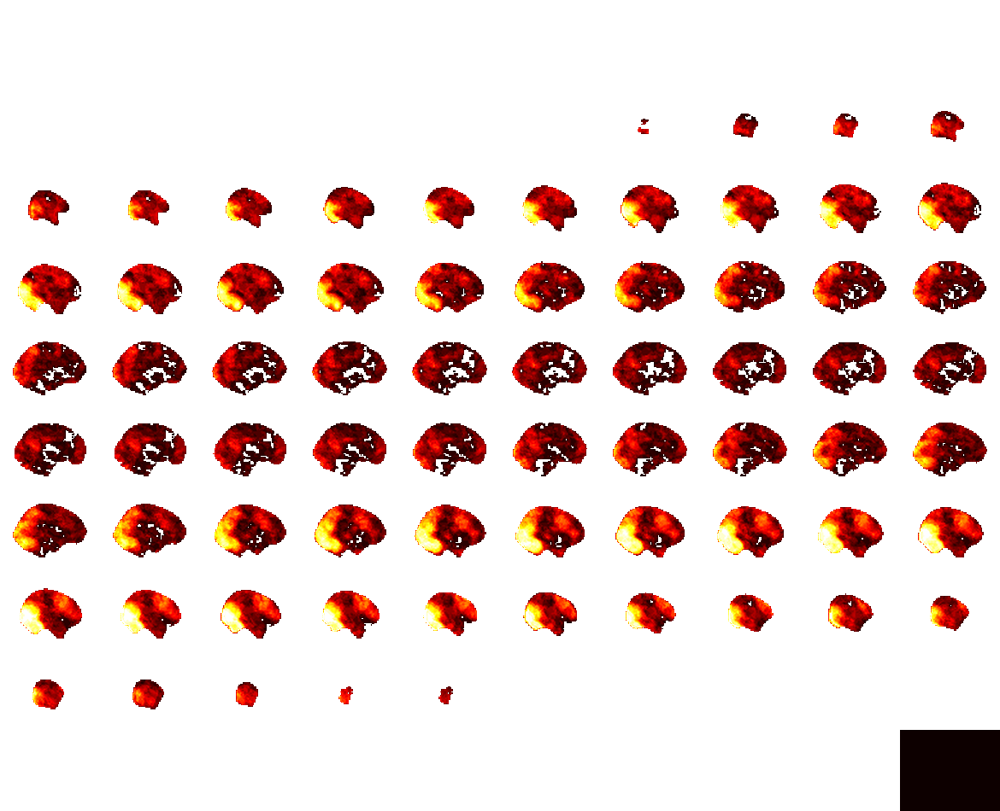

In [98]:
threshold_value = 0.1

RDM_brain = SL_feat_RDM_brain["features_fc_2"]

RDM_brain_bin_list = []

for i in range(20):
    RDM_brain_bin = np.where(RDM_brain[i] > threshold_value, 1, 0)
    RDM_brain_bin_list.append(RDM_brain_bin)

RDM_brain_bin_array = np.stack(RDM_brain_bin_list, axis=0)
SL_threshcount = np.sum(RDM_brain_bin_array, axis = 0)
plot_SL_img = new_img_like(tmp_img, SL_threshcount)
view = plotting.view_img(plot_SL_img, title = "threshold_value = {}".format(threshold_value))
view


## Group analysis
When these results are used for group analysis across multiple subjects, it may be good to Fisher-transform the correlation values, so that they are more normally distributed.

### MP 1

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_24256\1177330799.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



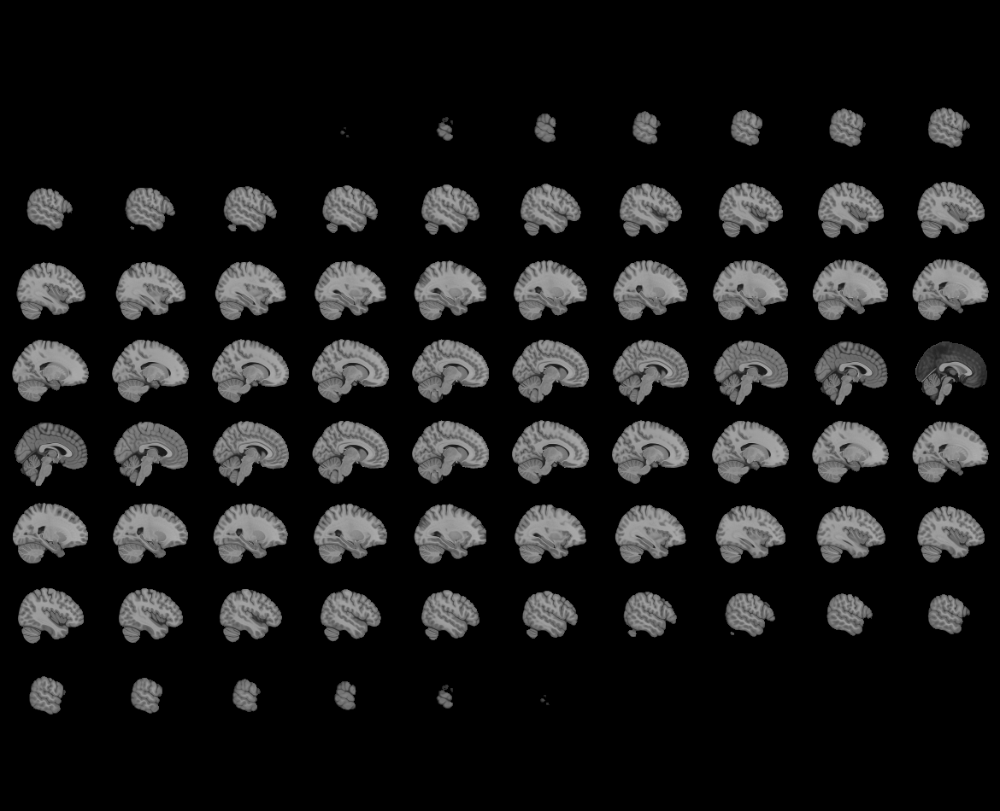
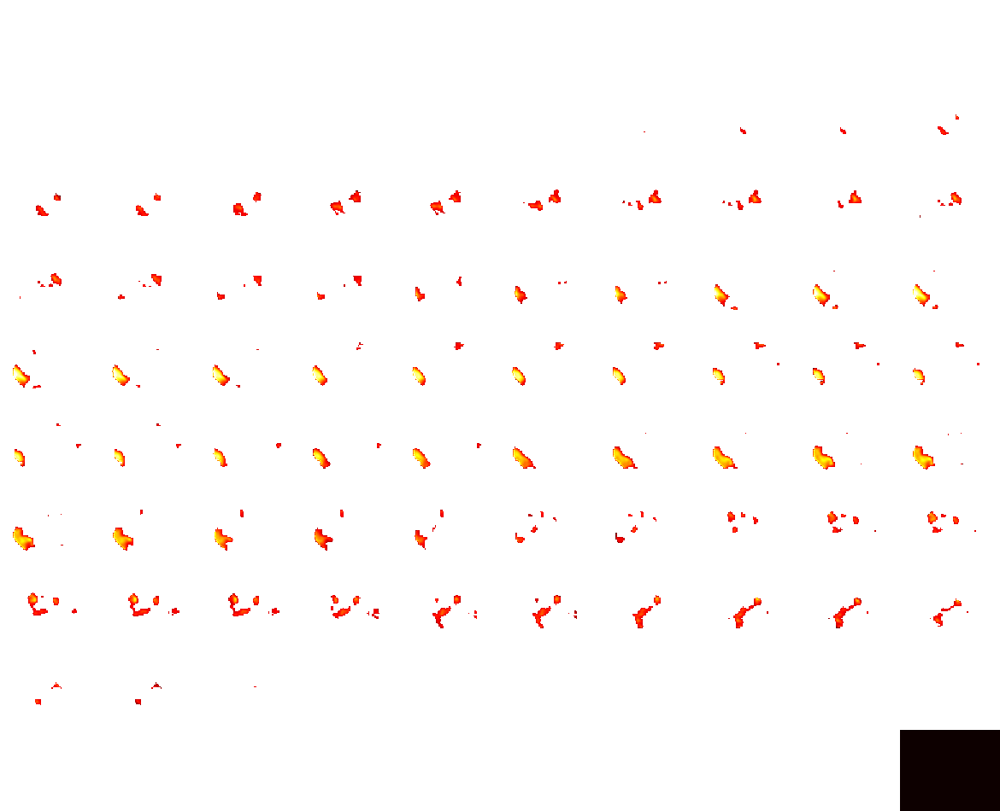

In [101]:
threshold = 2 # p < 0.01
layer_counter = 0

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[0]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn60_mp1.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### MP 2

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_24256\3227746119.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



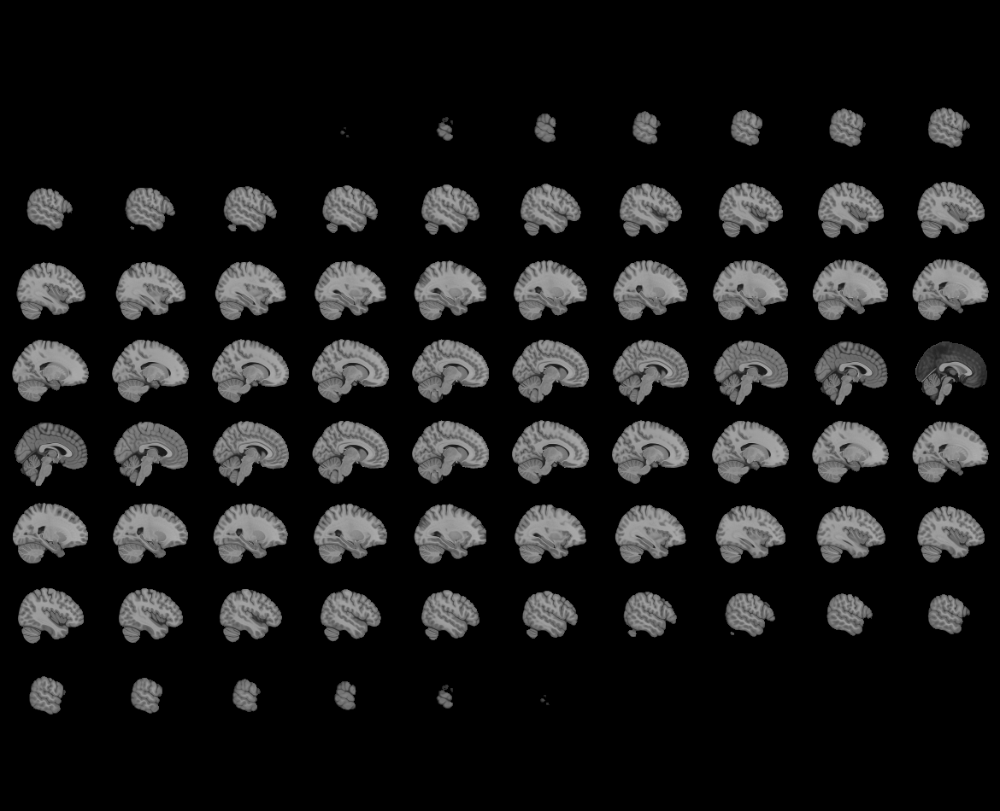
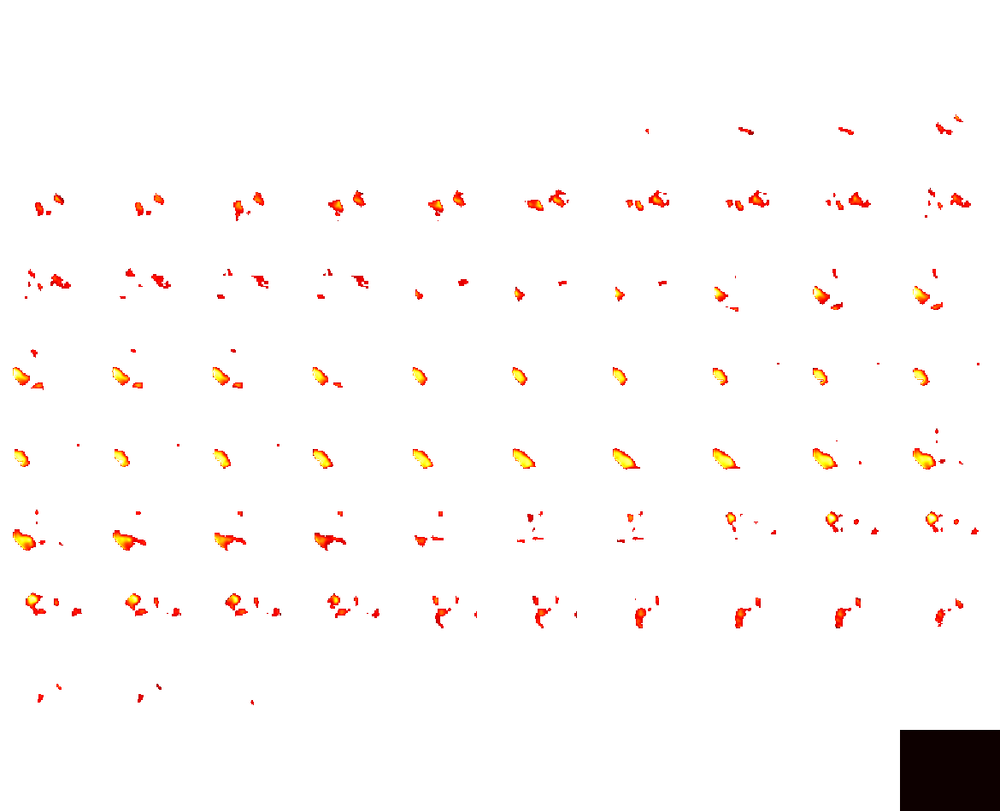

In [102]:
threshold = 2 # p < 0.01
layer_counter = 1

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn60_mp2.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### MP 3

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_24256\3610763089.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



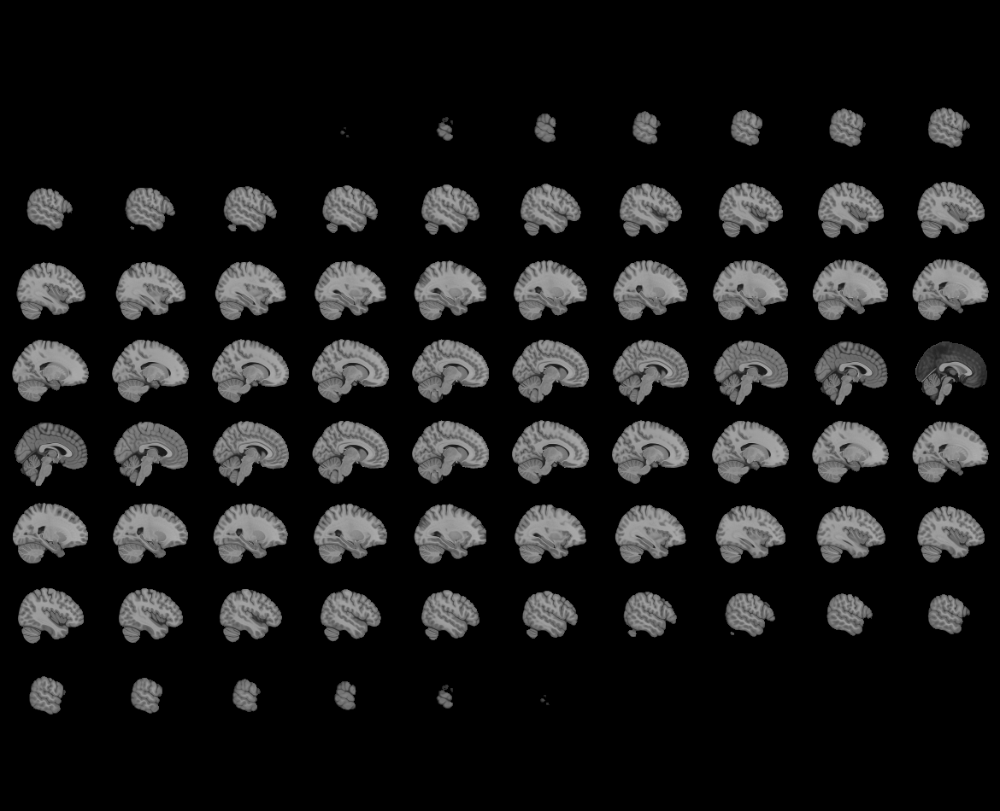
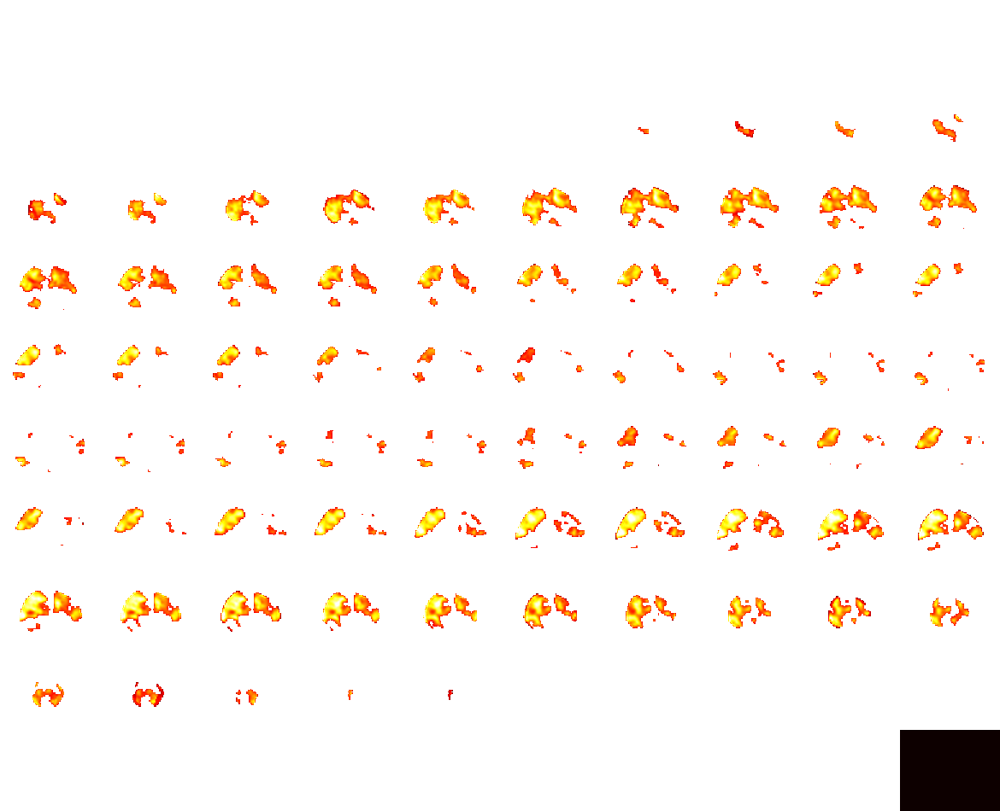

In [103]:
threshold = 2 # p < 0.01
layer_counter = 2

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn60_mp3.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### MP 4

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_24256\1719118431.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



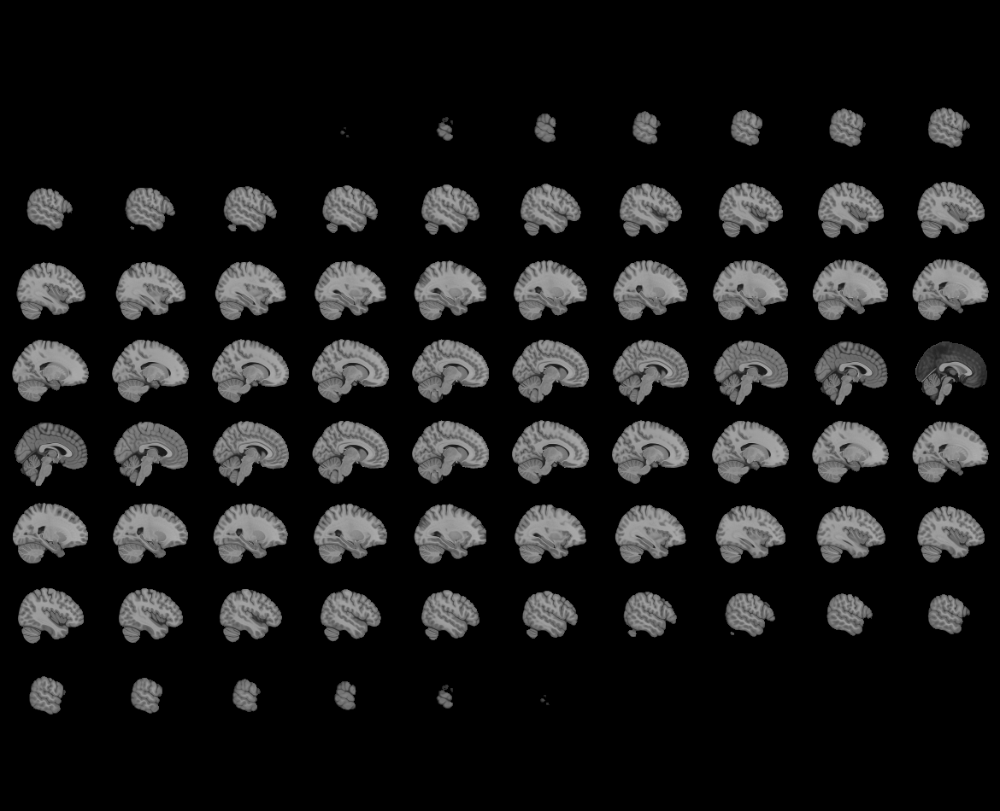
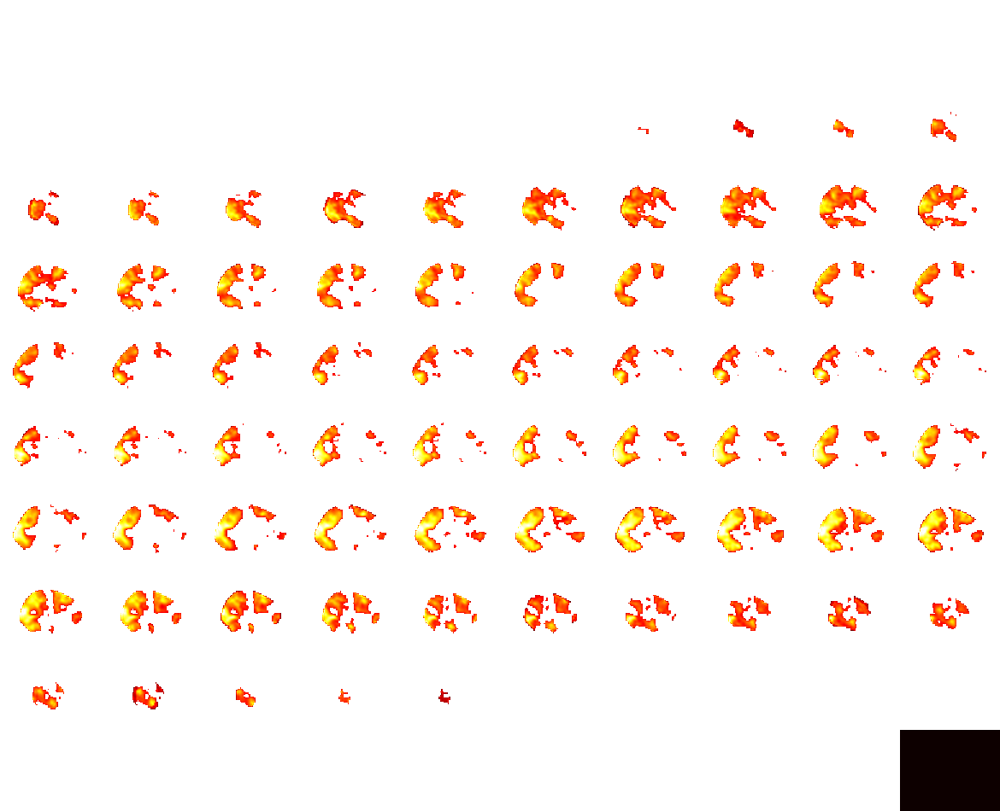

In [104]:
threshold = 2 # p < 0.01
layer_counter = 3

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn60_mp4.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### MP 5

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_24256\2826870549.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



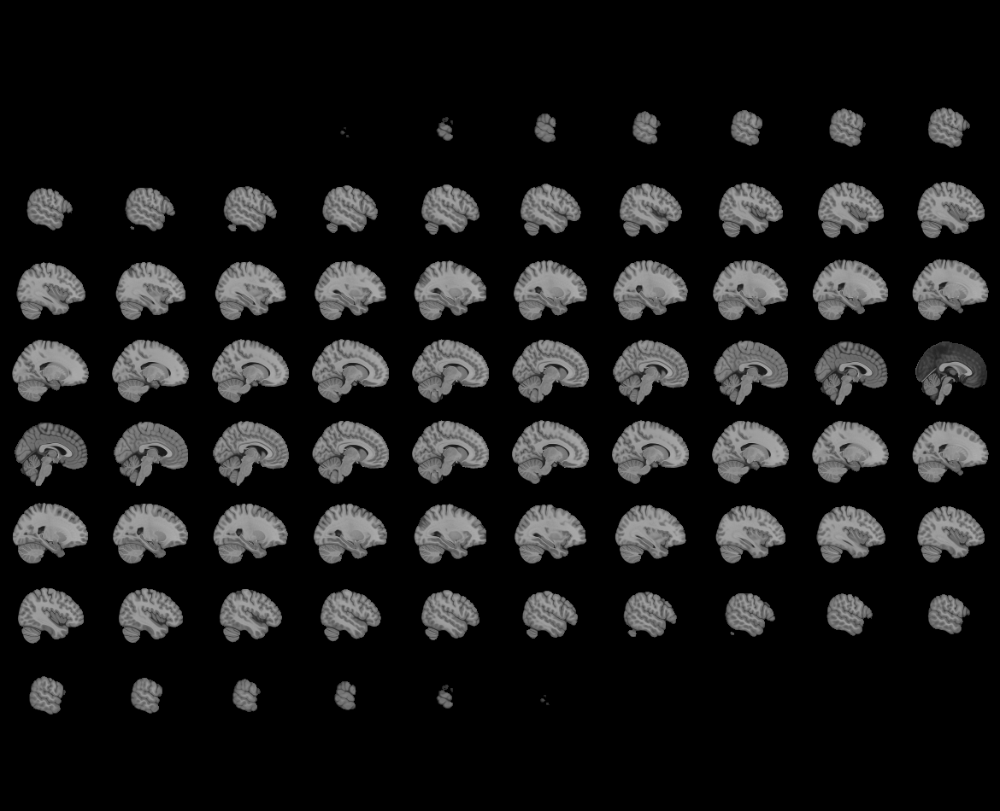
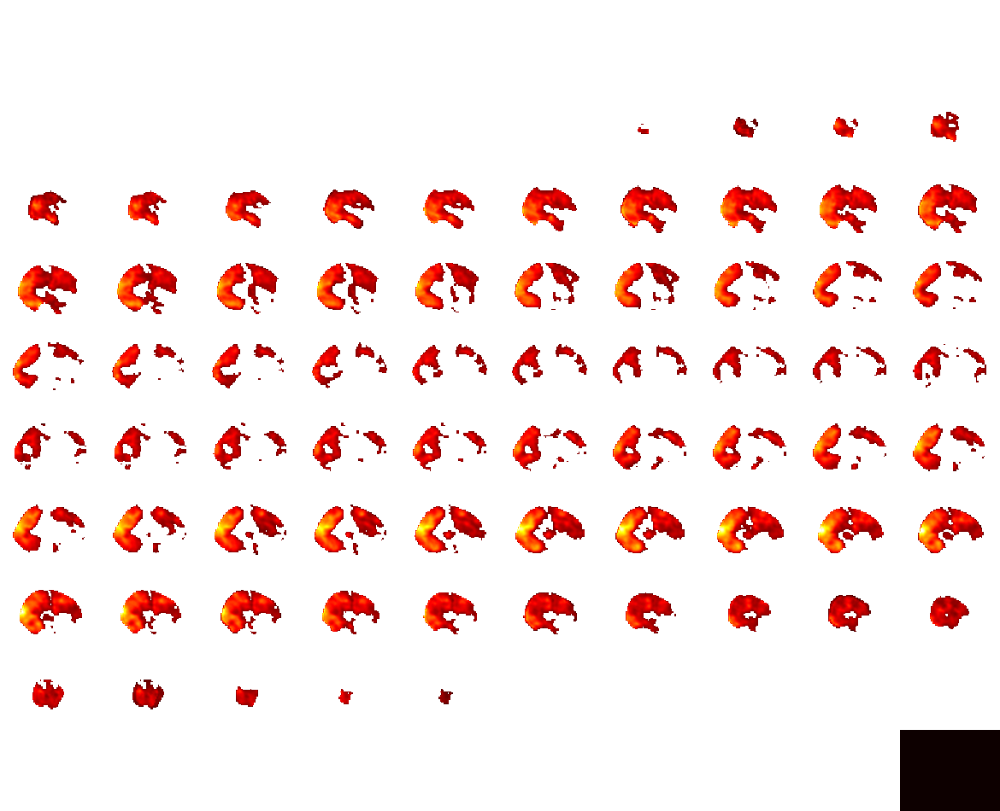

In [105]:
threshold = 2 # p < 0.01
layer_counter = 4

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn60_mp5.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### FC 1

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_24256\1054367199.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



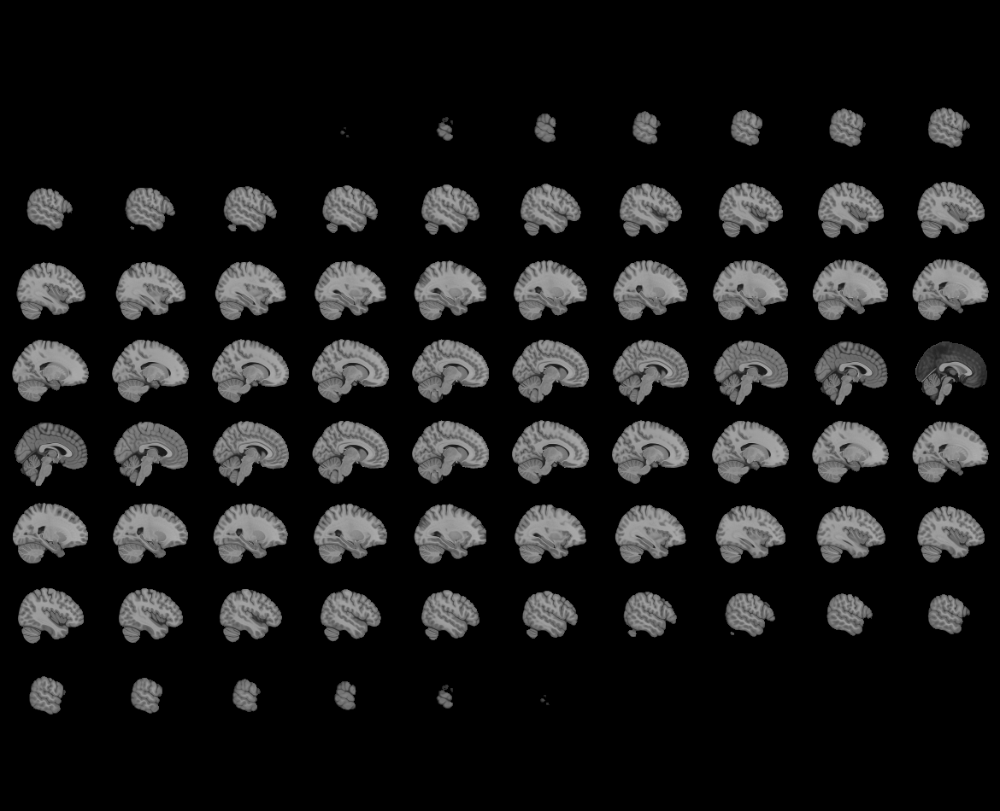
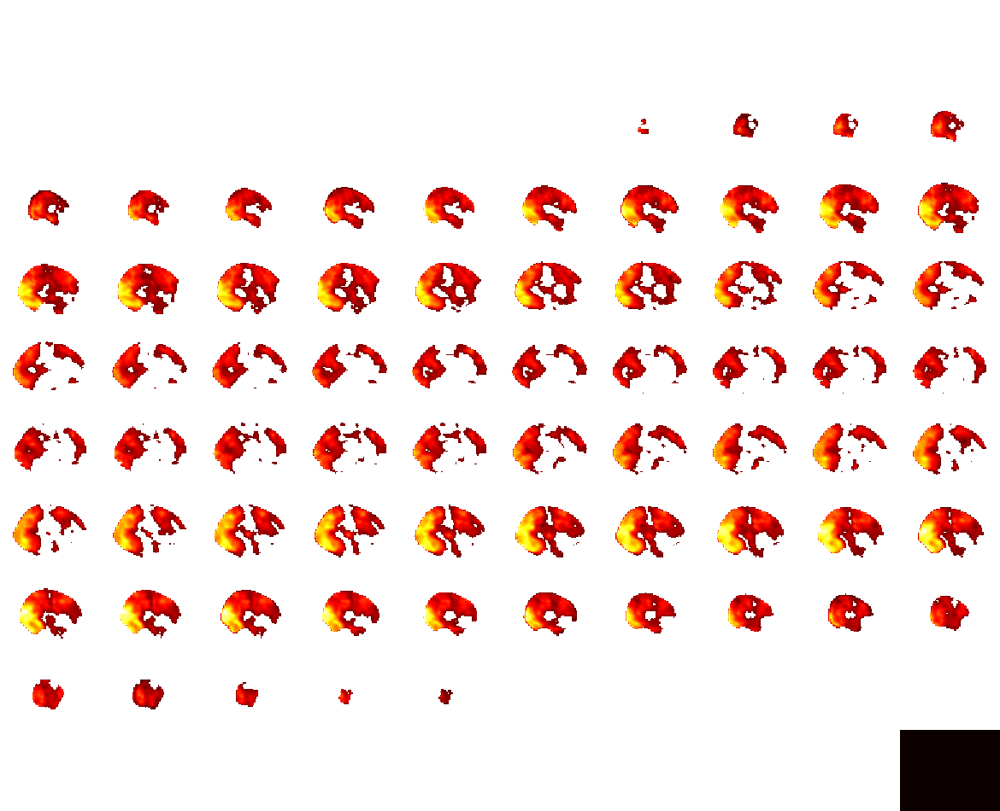

In [106]:
threshold = 2 # p < 0.01
layer_counter = 5

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn60_fc1.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view

### FC2

C:\Users\yujunchen\AppData\Local\Temp\ipykernel_24256\2781714856.py:28: RuntimeWarning: divide by zero encountered in log10
  neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro_clone\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



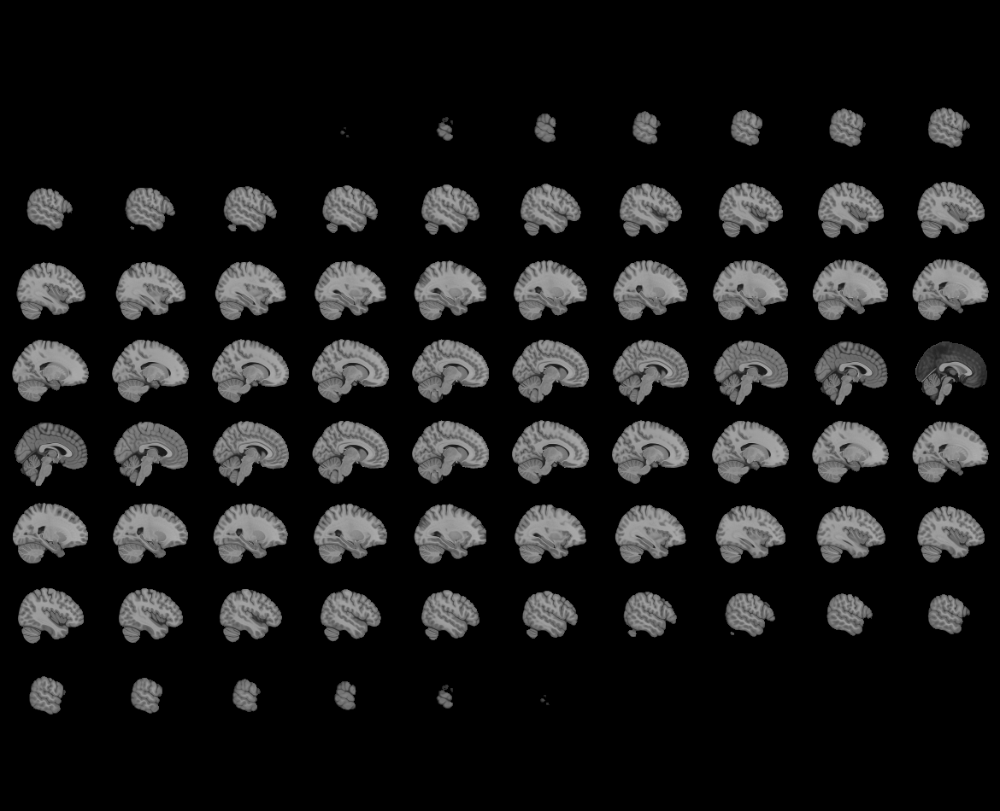
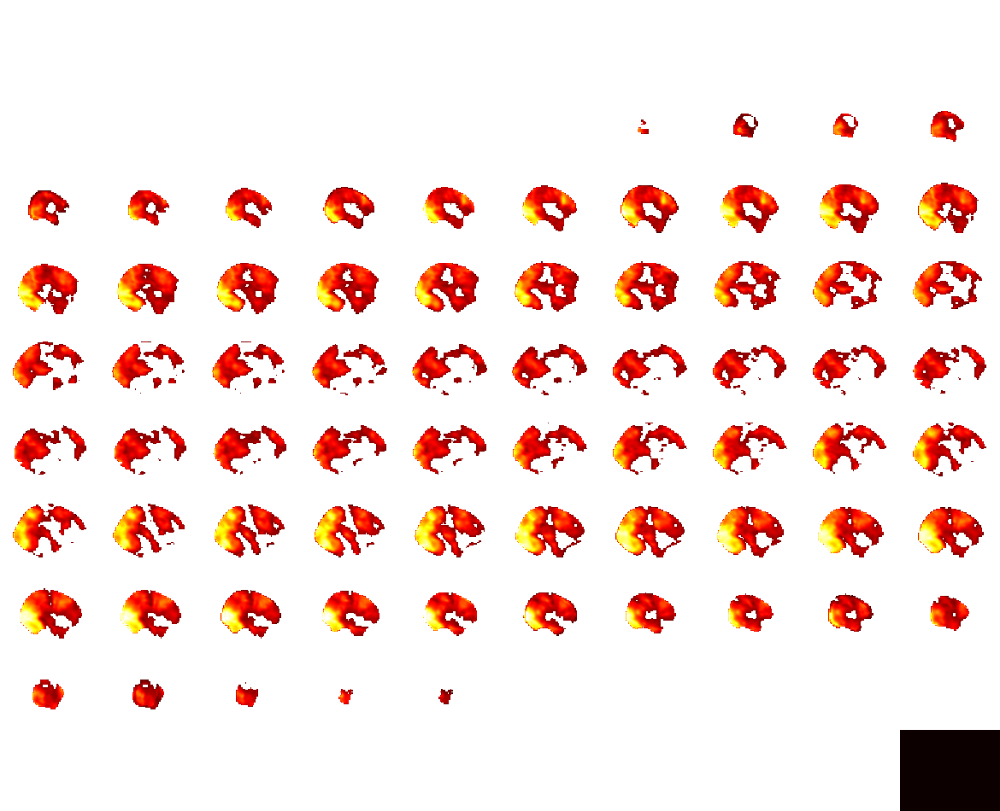

In [107]:
threshold = 2 # p < 0.01
layer_counter = 6

# fisher z tranformation
eval_score_list = SL_feat_eval_score[features_namelist[layer_counter]]
eval_score_array = np.array(eval_score_list)
seed_to_voxel_correlations_fisher_z = np.arctanh(eval_score_array)

# t-test
t_stat_list = []
p_value_list = []

for i in range(seed_to_voxel_correlations_fisher_z.shape[-1]):
    t_statistic, p_value = stats.ttest_1samp(a=seed_to_voxel_correlations_fisher_z[:,i], popmean=0) 
    t_stat_list.append(t_statistic)
    p_value_list.append(p_value)

t_stat_array = np.array(t_stat_list)
p_value_array = np.array(p_value_list)

# corrected p=values
reject_decision, corrected_pvalue = fdrcorrection(p_value_array, alpha=0.001, method='indep', is_sorted=False)
x, y, z = mask.shape
corrected_p_value_array = np.empty([x*y*z])
corrected_p_value_array[list(SL_RDM.rdm_descriptors['voxel_index'])] = corrected_pvalue

# convert the p=values to negative log10
neg_log_corrected_p = np.log10(corrected_p_value_array) * (-1)
neg_log_corrected_p_brain = neg_log_corrected_p.reshape([x, y, z])

# plot the negative log10 p=values
plot_corrected_neglog_pvalue_img = new_img_like(tmp_img, neg_log_corrected_p_brain)
nib.save(plot_corrected_neglog_pvalue_img, os.path.join("C:/Users/yujunchen/Dropbox (UFL)/Searchlight results", 'nn60_fc2.nii.gz'))
view = plotting.view_img(plot_corrected_neglog_pvalue_img, threshold = threshold)
view